#### Importing Text2Image, ImageComposition, and Storyboard classes

In [2]:
from scripts.image_composer import ImageComposer
from scripts.image_generator import ImageGenerater
from scripts.storyboard_visualizer import StoryBoard

#### Data
Let's consider a sample of asset_assumption

In [3]:
concept = {
    "frame_1": {"Background": "A dynamic, abstract representation of sound waves that move in sync with the user's interactions."},
    "frame_2": {"Background": "A high-resolution 3D Coca-Cola bottle center-screen, bubbles rising to the top, transitioning into a sleek DJ turntable with a vinyl record that has the Coke Studio logo."},
    "frame_3": {"Background": "With each beat added to the mix, the screen erupts into a dynamic display of colors, creating a visual celebration that mirrors the energy of Coke Studio's musical fusion. This kaleidoscopic animation evolves with the complexity of the user's mix, symbolizing the blend of cultures and music. At the heart of this vibrant spectacle, a 'Play Your Mix' button pulses in rhythm with the music, its design inviting and central, encouraging the viewer to engage and share their creation. The pulsing button serves as a visual anchor, drawing the viewer's attention and culminating the creative process."},
    "frame_4": {"Background": "A series of fast-paced, exciting moments - a cityscape at sunset, a bustling street market, a serene forest. Each scene is richly detailed, drawing the viewer in."},
    "frame_5": {"Background": "A suspenseful animation of a LEGO CITY set, with buildings, vehicles, and mini-figures coming to life in a dynamic, 3D environment. The animation is designed to captivate the viewer's attention and set the stage for the upcoming challenge."}
}

#### Image Generation with `stability-ai/stable-diffusion` via `replicate`.

In [ ]:
ig = ImageGenerater(concept)
generated_images = ig.generate_images()

In [ ]:
#generated_images
img1 = list(generated_images.values())[0][0][1]
img2 = list(generated_images.values())[1][0][1]
img3 = list(generated_images.values())[2][0][1]
img2 = list(generated_images.values())[3][0][1]

#### Composite images generated

In [ ]:
ic = ImageComposer(600,600, list(generated_images.values()))
generated_frames = ic.generate_frames()

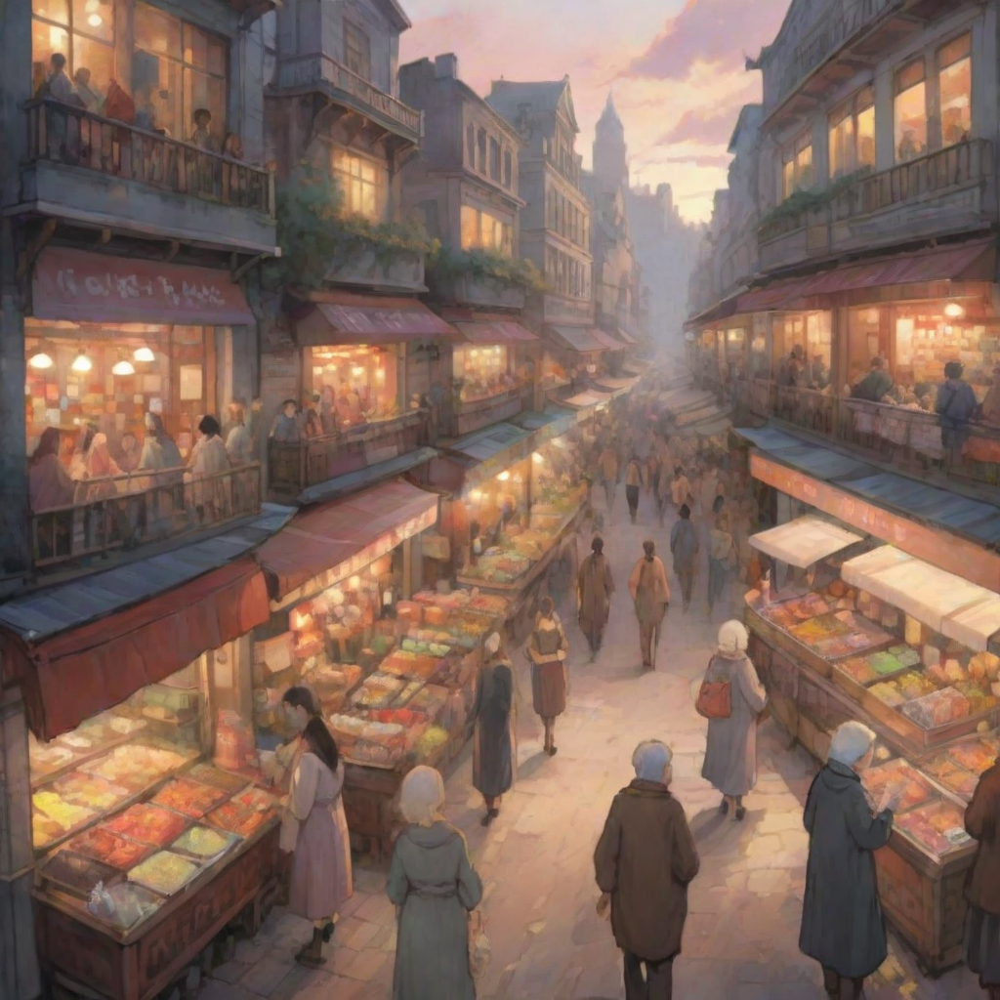

In [ ]:
generated_frames[3]

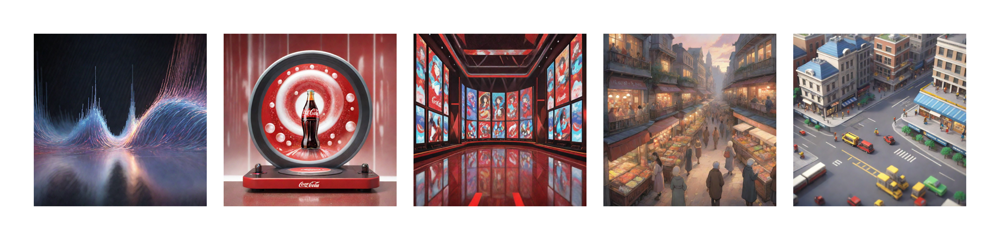

In [ ]:
StoryBoard.combine_images_horizontally(generated_frames)

In [ ]:
generated_images

[<PIL.Image.Image image mode=RGBA size=1024x1024>,
 <PIL.Image.Image image mode=RGBA size=1024x1024>,
 <PIL.Image.Image image mode=RGBA size=1024x1024>,
 <PIL.Image.Image image mode=RGBA size=1024x1024>,
 <PIL.Image.Image image mode=RGBA size=1024x1024>]

In [ ]:
output = replicate.run(
    "stability-ai/stable-diffusion-inpainting:95b7223104132402a9ae91cc677285bc5eb997834bd2349fa486f53910fd68b3",
    input={
        "mask": img2[0],
        "image": img3[0],
        "width": 512,
        "height": 512,
        #"prompt": "Face of a yellow cat, high resolution, sitting on a park bench",
        "scheduler": "DPMSolverMultistep",
        "num_outputs": 1,
        "guidance_scale": 7.5,
        "num_inference_steps": 25
    }
)
print(output)